In [1]:
%matplotlib qt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle  #To generate the model
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from dataprep.eda import plot,plot_correlation,plot_missing
from pandas_profiling import ProfileReport
from sklearn.metrics import silhouette_samples,silhouette_score

NumExpr defaulting to 8 threads.


## Load Data

In [2]:
dfa = pd.read_csv("outputTunisianet.csv")
dfa = dfa[['brand','price','reference','title']]
print('Total Row : ', len(dfa))

Total Row :  1645


In [3]:
dfa.columns

Index(['brand', 'price', 'reference', 'title'], dtype='object')

In [4]:
dfa

,brand,price,reference,title
0,https://www.tunisianet.com.tn/270_versus,"439,000 DT",[VBOOK14SLVV1.],Pc portable Versus V-Book / Quad Core / 2 Go
1,https://www.tunisianet.com.tn/3_lenovo,"839,000 DT",[81D600DDFE],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
2,https://www.tunisianet.com.tn/3_lenovo,"889,000 DT",[82C6006GFE],PC Portable Lenovo V14 ADA / Dual Core / 4 Go
3,https://www.tunisianet.com.tn/79_asus,"899,000 DT",[X543NA-AR297T],Pc portable Asus X543NA / Dual Core / 4 Go / Gris
4,https://www.tunisianet.com.tn/3_lenovo,"902,000 DT",[81D600DDFE-8],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
...,...,...,...,...
1640,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS216],Montre Pour Femme Swatch LOVELY LILAC YLS216
1641,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS217],Montre Pour Femme Swatch STARRY PARTY YLS217
1642,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS220],Montre pour femme Swatch Rose Sparkle YLS220
1643,https://www.tunisianet.com.tn/874_swatch,"360,000 DT",[SFK389GA],Montre Pour femme Swatch INCANTATA SFK389GA / ...


In [5]:
#pd.set_option('display.max_rows',df_tunisianet.shape[0]+1)

In [6]:
pd.set_option('display.max_rows',10)

In [7]:
dfa

,brand,price,reference,title
0,https://www.tunisianet.com.tn/270_versus,"439,000 DT",[VBOOK14SLVV1.],Pc portable Versus V-Book / Quad Core / 2 Go
1,https://www.tunisianet.com.tn/3_lenovo,"839,000 DT",[81D600DDFE],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
2,https://www.tunisianet.com.tn/3_lenovo,"889,000 DT",[82C6006GFE],PC Portable Lenovo V14 ADA / Dual Core / 4 Go
3,https://www.tunisianet.com.tn/79_asus,"899,000 DT",[X543NA-AR297T],Pc portable Asus X543NA / Dual Core / 4 Go / Gris
4,https://www.tunisianet.com.tn/3_lenovo,"902,000 DT",[81D600DDFE-8],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
...,...,...,...,...
1640,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS216],Montre Pour Femme Swatch LOVELY LILAC YLS216
1641,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS217],Montre Pour Femme Swatch STARRY PARTY YLS217
1642,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS220],Montre pour femme Swatch Rose Sparkle YLS220
1643,https://www.tunisianet.com.tn/874_swatch,"360,000 DT",[SFK389GA],Montre Pour femme Swatch INCANTATA SFK389GA / ...


# EDA : Exploratory data analysis with

#### - dataprep.eda
#### - pandas_profiling

  0%|          | 0/129 [00:00<?, ?it/s]

C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:881: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))



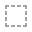
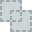
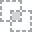
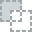
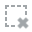
...
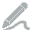
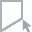
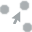
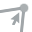
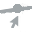

In [8]:
#Basic exploration for all comumns via plot(dfa)
plot(dfa)

  0%|          | 0/74 [00:00<?, ?it/s]

C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:881: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))



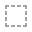
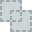
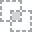
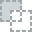
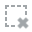
...
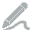
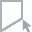
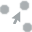
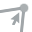
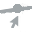

In [9]:
plot(dfa,'reference')

In [12]:
profile=ProfileReport(dfa)

In [13]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/17 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
plt.plot(dfa.values[:,0],dfa.values[:,1],"rp");

# Treatment of missing values

In [15]:
#see missing values
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1645 entries, 0 to 1644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   brand      1645 non-null   object
 1   price      1645 non-null   object
 2   reference  1645 non-null   object
 3   title      1645 non-null   object
dtypes: object(4)
memory usage: 51.5+ KB


In [16]:
#search missing values
#dfa.isna()
#dfa.isnull()
#dfa.isna().sum(axis=0)  #claculale the number of missing values column by column
dfa.isna().sum(axis=1)  #claculale the number of missing values line by line
dfa.isnull().sum().sort_values(ascending=False)
dfa.isnull().sum().any()

False

In [17]:
(dfa.isna().sum()/dfa.shape[0])*100 #percentage of null values in our dataframe

brand        0.0
price        0.0
reference    0.0
title        0.0
dtype: float64

######      If the percentage of missing fields > 95% ==>we delete the column
######  If the percentage of missing fields<50%==>we delete the lines containing fields 
######  If the percentage of missing fields betwen 50% et 95% ==>we are thinking of filling in these fields :mediane,moyen,frequent,previous or next value


In [18]:
###### solution 1:delete lines containing at least one missing field

dfa_clean=dfa.dropna() #thresh=5 :we fix to 5 missing values

In [19]:
dfa_clean.shape

(1645, 4)

In [20]:
#dfa_clean=dfa.dropna(axis=1) #delete comumns

In [21]:
#fill in the missing values:for the missing variables, we will replace them with the values that repeat the most
dfa.apply(lambda x:x.fillna(x.value_counts().index[0]))

,brand,price,reference,title
0,https://www.tunisianet.com.tn/270_versus,"439,000 DT",[VBOOK14SLVV1.],Pc portable Versus V-Book / Quad Core / 2 Go
1,https://www.tunisianet.com.tn/3_lenovo,"839,000 DT",[81D600DDFE],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
2,https://www.tunisianet.com.tn/3_lenovo,"889,000 DT",[82C6006GFE],PC Portable Lenovo V14 ADA / Dual Core / 4 Go
3,https://www.tunisianet.com.tn/79_asus,"899,000 DT",[X543NA-AR297T],Pc portable Asus X543NA / Dual Core / 4 Go / Gris
4,https://www.tunisianet.com.tn/3_lenovo,"902,000 DT",[81D600DDFE-8],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
...,...,...,...,...
1640,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS216],Montre Pour Femme Swatch LOVELY LILAC YLS216
1641,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS217],Montre Pour Femme Swatch STARRY PARTY YLS217
1642,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS220],Montre pour femme Swatch Rose Sparkle YLS220
1643,https://www.tunisianet.com.tn/874_swatch,"360,000 DT",[SFK389GA],Montre Pour femme Swatch INCANTATA SFK389GA / ...


# Treatment of qualitative variables

In [22]:
dfa.dtypes

brand        object
price        object
reference    object
title        object
dtype: object

In [23]:
dfa.describe(include='O') #include = 'O': to display categorical values

,brand,price,reference,title
count,1645,1645,1645,1645
unique,97,588,1320,1274
top,https://www.tunisianet.com.tn/6_hp,"205,000 DT",[A3121H11],"Écran HP V214a 20.7"" Full HD"
freq,258,44,4,4


In [24]:
dfa_clean["brand"].nunique()  #97 categories

97

In [25]:
dfa['brand'].value_counts()

https://www.tunisianet.com.tn/6_hp            258
https://www.tunisianet.com.tn/874_swatch      180
https://www.tunisianet.com.tn/29_dell         119
https://www.tunisianet.com.tn/3_lenovo        110
https://www.tunisianet.com.tn/79_asus          82
                                             ... 
https://www.tunisianet.com.tn/261_dahua         1
https://www.tunisianet.com.tn/563_snopy         1
https://www.tunisianet.com.tn/211_kingston      1
https://www.tunisianet.com.tn/159_nokia         1
https://www.tunisianet.com.tn/230_gigabyte      1
Name: brand, Length: 97, dtype: int64

In [26]:
#Remplace categorical values with numeric values 0,1,2,...
#labelencoder=LabelEncoder()
#for i in dfa_clean:
#    dfa_clean[i]=labelencoder.fit_transform(dfa_clean[i])

In [27]:
#dfa_clean

In [28]:
#labelencoder.inverse_transform([13])

### We should use One Hot Encoder if we have more than 2 categories

In [29]:
oneHotEncoder=OneHotEncoder()
matrice_brand=oneHotEncoder.fit_transform(dfa_clean['brand'].values.reshape(-1,1))
matrice_price=oneHotEncoder.fit_transform(dfa_clean['price'].values.reshape(-1,1))
matrice_reference=oneHotEncoder.fit_transform(dfa_clean['reference'].values.reshape(-1,1))
matrice_title=oneHotEncoder.fit_transform(dfa_clean['title'].values.reshape(-1,1))

In [30]:
brand_encode=matrice_brand.toarray()
price_encode=matrice_brand.toarray()
reference_encode=matrice_brand.toarray()
title_encode=matrice_brand.toarray()

In [31]:
print(type(brand_encode))
print(type(price_encode))
print(type(reference_encode))
print(type(title_encode))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [32]:
brand_df=pd.DataFrame(data=brand_encode,index=dfa_clean.index)
price_df=pd.DataFrame(data=price_encode,index=dfa_clean.index)
reference_df=pd.DataFrame(data=reference_encode,index=dfa_clean.index)
title_df=pd.DataFrame(data=title_encode,index=dfa_clean.index)

In [33]:
oneHotEncoder.categories_

[array(['2x Baguette Lumiere LED avec Aiment Xigmatek Xi-ray / Bleu',
        '2x Baguette Lumiere LED avec Aiment Xigmatek Xi-ray / Rouge',
        '2x Baguette Lumiere LED avec Aiment Xigmatek Xi-ray / Vert', ...,
        'Écran Samsung professionnel QB43R 43" / 4K UHD/ Wifi',
        'Écran Samsung professionnel QB49R 49" / 4K UHD/ Wifi',
        'Écran Samsung professionnel QB55R 55" / 4K UHD/ Wifi'],
       dtype=object)]

In [34]:
pd.set_option('display.max_rows',price_df.shape[0]+1)

In [35]:
brand_df

,0,1,2,3,4,5,6,7,8,9,...,87,88,89,90,91,92,93,94,95,96
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**The trap of the dummy variable**

 * When we encode a qualitative variable having more than 2 modalities, for example 6 modalities, we end up with a matrix with 6 columns.

* Often these 6 columns are auto-correlated

* We remove a column

Tunisia: one column with 24 governorates ==> One Hot Encoder ==> 24 colones ==> Dummy variables trap ==> remove of a column

# Concatinate Dataframes

In [36]:
#dfa_clean=dfa_clean.drop(columns=["",""])

In [37]:
brand_df=brand_df.drop(columns=[0])
price_df=price_df.drop(columns=[0])
reference_df=reference_df.drop(columns=[0])
title_df=title_df.drop(columns=[0])


In [38]:
brand_df

,1,2,3,4,5,6,7,8,9,10,...,87,88,89,90,91,92,93,94,95,96
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
dfa_encode=pd.concat([brand_df,price_df,reference_df,title_df],axis=1)

In [40]:
dfa_encode.shape

(1645, 384)

In [41]:
dfa_encode.describe()

,1,2,3,4,5,6,7,8,9,10,...,87,88,89,90,91,92,93,94,95,96
count,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,...,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000
mean,0.003647,0.022492,0.019453,0.001216,0.000608,0.005471,0.007295,0.001216,0.001216,0.029179,...,0.003647,0.001216,0.000608,0.001824,0.109422,0.002432,0.006079,0.002432,0.001824,0.000608
std,0.060302,0.148324,0.138152,0.034858,0.024656,0.073787,0.085124,0.034858,0.034858,0.168360,...,0.060302,0.034858,0.024656,0.042679,0.312263,0.049266,0.077754,0.049266,0.042679,0.024656
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [42]:
#pd.plotting.scatter_matrix(dfa_encode,figsize=(20,20))

In [43]:
X=dfa_encode.iloc[:,:]

In [44]:
#we notice that X contains several variables (the curse of large dimensions)
# =>The solution: Apply PCA (Dimentionality reduction)
#X

In [146]:
dfa_encode.hist(figsize=(20,20))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000021E2FC25EB0>,
      dtype=object)

In [147]:
X.hist(figsize=(20,20))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000021E488F4AF0>,
      dtype=object)

### There are 3 techniques :


#### - Random Sampling
#### - RobustScaler :we use the median at the average
#### - We transform the digital data in an interval between [0,1]


- Before applying the Kmeans algorithm, it is absolutely necessary to unify the scale of all the variables.

- we are therefore talking about rescaling

- let x be a random variable and z a reduced centered random variable

$$ z=\frac{x-\mu }{\sigma}   $$

- This transformation is linear (the shape of the histograms does not change)

In [45]:
X.describe()

,1,2,3,4,5,6,7,8,9,10,...,87,88,89,90,91,92,93,94,95,96
count,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,...,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000
mean,0.003647,0.022492,0.019453,0.001216,0.000608,0.005471,0.007295,0.001216,0.001216,0.029179,...,0.003647,0.001216,0.000608,0.001824,0.109422,0.002432,0.006079,0.002432,0.001824,0.000608
std,0.060302,0.148324,0.138152,0.034858,0.024656,0.073787,0.085124,0.034858,0.034858,0.168360,...,0.060302,0.034858,0.024656,0.042679,0.312263,0.049266,0.077754,0.049266,0.042679,0.024656
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [46]:
Xss=(X-X.mean())/X.std()

In [47]:
Xss

,1,2,3,4,5,6,7,8,9,10,...,87,88,89,90,91,92,93,94,95,96
0,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
1,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
2,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
3,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
4,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
5,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
6,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
7,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
8,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
9,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656


In [48]:
Xss.hist();

# Spliting of the dataset into two parts:train dataset and test dataset

In [49]:
X_train, X_test = train_test_split(Xss,test_size=0.2,random_state=1)

In [50]:
print(X_train.shape)
print(X_test.shape)
print(dfa_encode.shape)

(1316, 384)
(329, 384)
(1645, 384)


## Application of the method "Elbow"

In [51]:
inertia = []
K = range(1, 90)
for k in K:
    km = KMeans(n_clusters=k)
    km.fit(Xss)
    inertia.append(km.inertia_) 
print(inertia)

[631295.9999999967, 624371.0597206968, 617625.1937901995, 610112.0517102194, 603912.885075786, 597027.6283597415, 590383.2397475312, 583734.5039978919, 576237.9281280345, 569727.6246744283, 563018.6469730543, 555980.3060354773, 549692.4508502919, 543253.8624465502, 536250.2812025889, 529411.958309227, 522742.5189536984, 516113.1636382914, 509275.45926045126, 502466.9524975632, 495859.05442688306, 488982.9157230936, 482279.7778586269, 475665.3247482319, 469169.3020355916, 462723.9029312925, 455711.3268305184, 448785.59995512903, 442443.1779597075, 435709.36865719315, 429244.0536588308, 422543.6238602664, 415915.4271008873, 409192.8315106017, 402740.6961076926, 395923.8658074004, 389437.37783472426, 382887.8508728376, 375989.3850257649, 369516.60440310196, 362923.5886222294, 356347.07517756696, 349625.6832152193, 343003.67807632795, 336467.2075709284, 329827.92009942443, 323145.8510987055, 316232.1974156396, 309993.3667452997, 303344.66372535453, 296756.3473520768, 290130.56932084274, 28

In [52]:
plt.plot(K, inertia,"rs--")
plt.xticks(K)
plt.xlabel('nombre de clusters')
plt.ylabel('Inertie intra-classes')
plt.title("Elbow Method")
plt.grid(True)

## Application d'une analyse par coposante principale

In [53]:

acp=PCA(0.9)

In [54]:
Xacp=acp.fit_transform(Xss)

In [55]:
acp.explained_variance_ratio_.shape

(86,)

In [56]:
Xacp

array([[-5.75056432e-01, -6.44246862e-01, -2.29301839e-01, ...,
        -7.86911002e-01,  2.32690797e-11,  9.84507058e-13],
       [-9.93921024e-01, -1.79771782e+00, -4.60625862e+00, ...,
        -1.96005361e-02,  5.50065739e-13, -3.25176815e-14],
       [-9.93921024e-01, -1.79771782e+00, -4.60625862e+00, ...,
        -1.96005361e-02,  5.48322532e-13, -2.11929209e-14],
       ...,
       [-2.15506856e+00,  5.54175828e+00,  3.51092741e-01, ...,
        -1.13871342e-02,  2.97320940e-13,  6.96640812e-15],
       [-2.15506856e+00,  5.54175828e+00,  3.51092741e-01, ...,
        -1.13871342e-02,  2.97320940e-13,  6.96640812e-15],
       [-2.15506856e+00,  5.54175828e+00,  3.51092741e-01, ...,
        -1.13871342e-02,  2.97385486e-13,  6.99896749e-15]])

In [57]:
#Application of the method "Elbow"
inertia = []
K = range(1, 90)
for k in K:
    km = KMeans(n_clusters=k)
    km.fit(Xacp)
    inertia.append(km.inertia_) 
print(inertia)

[572067.5123855306, 565023.9309930176, 558129.6866058806, 551002.1451844143, 544297.5935357078, 537823.7745069303, 531175.8461663366, 523974.4133267801, 517322.5454217159, 510494.84798470925, 503644.48450494563, 496487.9096334054, 490317.3619439524, 483276.3490200372, 476618.7361272198, 469858.42112016224, 463534.6049904192, 456823.8740549908, 449865.15606124233, 443345.1039336808, 436304.5874534619, 429932.37446824054, 423205.60315024696, 416438.15526345413, 409816.4425830149, 403183.14159051975, 396458.87193622446, 389887.4482019393, 383030.8333276782, 376570.39532586484, 369975.22172335285, 363245.4305448467, 356773.42066240497, 350044.357562232, 343377.3435766949, 336743.1129984611, 330129.7490434675, 323483.84780122485, 316847.15194898966, 310334.0355691942, 303683.8600528869, 297057.97631045687, 290374.4856428943, 283751.6608743744, 277175.96843871375, 270517.469586971, 263911.5088097884, 257293.09068005736, 250698.5887382107, 244104.13350362316, 237472.02112147174, 230914.645666

In [58]:
plt.plot(K, inertia,"bs--")
plt.xticks(K)
plt.xlabel('nombre de clusters')
plt.ylabel('Inertie intra-classes')
plt.title("Elbow Method")
plt.grid(True)

In [104]:
model=KMeans(n_clusters=87)

In [105]:
y_pred=model.fit_predict(X_train)

In [106]:
model.cluster_centers_

array([[-0.06048589, -0.1516442 , -0.14080749, ..., -0.04935642,
        -0.0427309 , -0.02465568],
       [-0.06048589, -0.1516442 , -0.14080749, ..., -0.04935642,
        -0.0427309 , -0.02465568],
       [-0.06048589, -0.1516442 , -0.14080749, ..., -0.04935642,
        -0.0427309 , -0.02465568],
       ...,
       [-0.06048589, -0.1516442 , -0.14080749, ..., -0.04935642,
        -0.0427309 , -0.02465568],
       [-0.06048589, -0.1516442 , -0.14080749, ..., -0.04935642,
        -0.0427309 , -0.02465568],
       [-0.06048589, -0.1516442 , -0.14080749, ..., -0.04935642,
        -0.0427309 , -0.02465568]])

In [107]:
labels=model.labels_

array([ 0, 11, 52, ..., 17,  1, 54])

In [ ]:
labels

In [108]:
model.inertia_ 

18803.795461981717

In [109]:
- model.score(X_train)

18803.795461981717

# Validation of the K-means model

In [110]:
y_pred_test=model.predict(X_test)

In [111]:
y_pred_test

array([66,  2, 86, 84, 49,  1, 71, 48,  4, 59,  2,  2, 65,  0, 59, 31, 48,
       25, 48, 81,  1,  2,  6, 77, 83,  1, 63, 31,  0,  2,  4,  1,  2, 86,
        2, 75,  2,  0, 81,  2,  2,  0, 63, 83,  4, 74, 83,  1, 49,  6, 76,
        2, 17, 65,  1,  6, 74,  2,  1,  1,  2, 76,  0,  2,  2,  2, 55, 31,
       17,  4,  1,  2,  4, 42,  0,  0, 86, 34, 63, 17, 11,  0,  2, 72, 63,
        2, 17,  1,  2,  0, 79, 65, 63, 52, 11, 72, 25,  2, 67, 31,  1,  1,
       60,  2, 62,  2, 77, 59,  4, 69, 75, 54, 78, 48,  6,  2,  1, 11, 59,
       54,  1, 48, 17, 83, 60, 57, 17, 11,  2,  4, 17, 78,  4, 49,  6,  2,
       42, 48,  2,  0,  2, 11,  2,  1, 56, 72, 17, 72, 25,  1,  2,  0,  1,
        2, 75, 54,  6,  1,  2,  4,  2, 72,  4,  4, 51,  6,  2, 11, 17, 54,
        2, 34, 80,  4, 65, 11, 70,  6, 63,  4, 34,  1,  2,  1, 83,  2, 83,
       59,  2, 58,  1, 75, 52, 49, 37,  2, 73,  0, 11,  4, 81, 34,  1,  4,
        1, 42, 42, 63,  1,  4,  2, 81, 17,  0,  2, 75,  2, 60,  1,  2,  2,
       42,  2,  2,  2,  1

### We try to minimize the intra inertia and maximize the inter inertia

## Cluster evaluation: the silhouette score

In [112]:
#calculating silhouette_score
silhouette_score(X_train,labels)

0.9529094399885694

## Cluster Profiling 

In [117]:
X_train["labels"]=labels

<ipython-input-117-6eb144844a4a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train["labels"]=labels


In [118]:
X_train.head()

,1,2,3,4,5,6,7,8,9,10,...,88,89,90,91,92,93,94,95,96,labels
793,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,0
702,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,11
341,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,52
660,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,6
575,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,4


In [120]:
clust_profile=X_train
clust_profile=clust_profile.groupby('labels').mean()
clust_profile['frq']=X_train.labels.value_counts().sort_index()
clust_profile

,1,2,3,4,5,6,7,8,9,10,...,88,89,90,91,92,93,94,95,96,frq
labels,,,,,,,,,,,,,,,,,,,,,
0,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,88
1,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,2.852007,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,142
2,-0.060486,-0.151644,-0.140807,0.101730,-0.024656,-0.074148,-0.085697,0.101730,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,210
3,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,2
4,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,100
5,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,28.653108,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,2
6,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,50
7,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,2
8,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656,4
